# Projet PRSTIM/TIFO

L'objectif de ce projet consiste à compter les bateaux sur chacune des deux images.

# Sommaire

- On compte les bateaux
- Lecture de la date incrustée
- Segmentation de l'eau

## On compte les bateaux

Les bateaux font partie des éléments qui ne restent pas d'une image à l'autre. Comprendre : à une position donnée, la probabilité d'avoir un bateau sur les deux images est très faible. On peut donc travailler sur les différences entre les deux images. Voici notre plan d'attaque :

- Calcul de `abs(im2 - im1)` en niveaux de gris
    - Les zones claires constituent de grands écarts entre `im1` et `im2`
    - Les zones foncées constituent l'absence de différence entre `im1` et `im2`
- Binarisation, par seuillage, du résultat
    - On obtient un ensemble d'objets "différences" sur un fond noir
- Discrimination des objets : bateau ou pas bateau ?
    - Forme, taille, position relative à l'eau
- Bateau dans `im1` ou `im2` ?
    - Comparaison `im1`/`im2` à la position étudiée

In [23]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

### Chargement des images

In [32]:
# Load images
im1, im2 = (
    cv2.imread("data/Venice_2019.png"),
    cv2.imread("data/Venice_2020.png"),
)

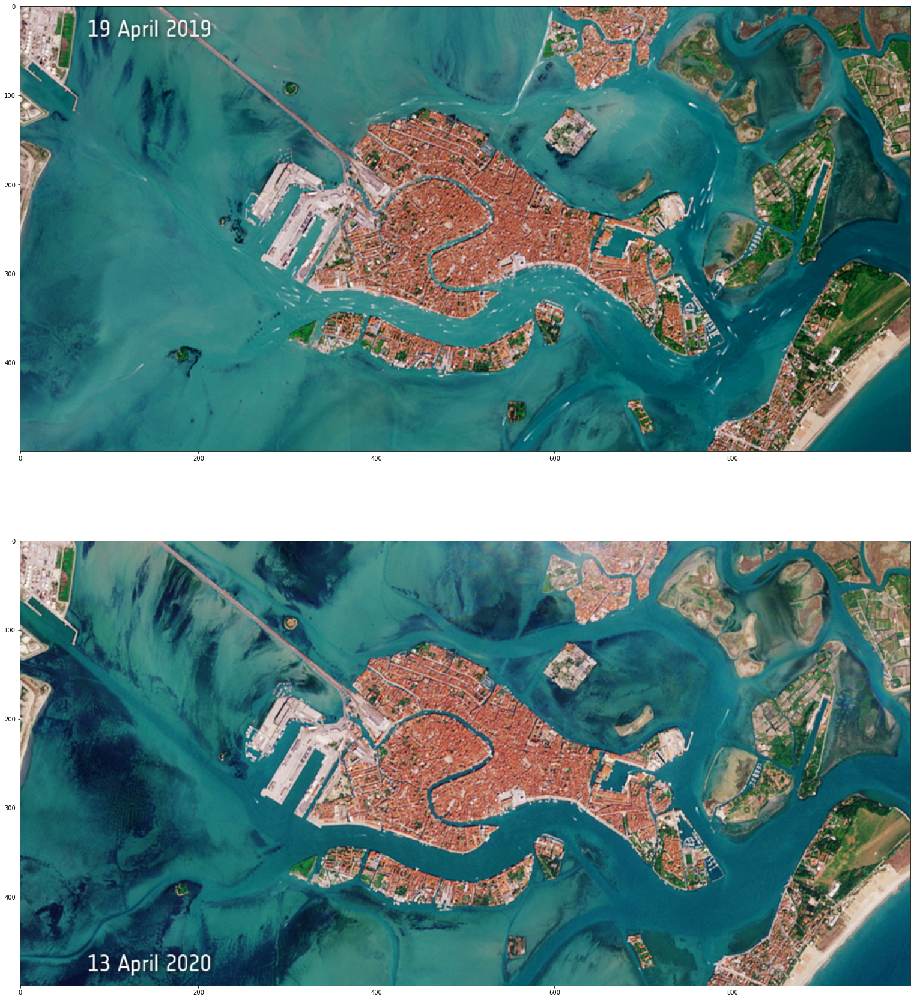

In [34]:
# Display
def bgr_to_rgb(img):
    b,g,r = cv2.split(img)
    return cv2.merge([r,g,b])

rgb1, rgb2 = bgr_to_rgb(im1), bgr_to_rgb(im2)
plt.figure(figsize=(60, 30))
plt.subplot(2, 1, 1)
plt.imshow(rgb1)
plt.subplot(2, 1, 2)
plt.imshow(rgb2)

### Pré-traitement

In [35]:
def preprocess(img):
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # img = cv2.equalizeHist(img)
    return img.astype(np.int16)  # Because uint8 won't allow negatives when we im2-im1


processed_im1, processed_im2 = preprocess(im1), preprocess(im2)

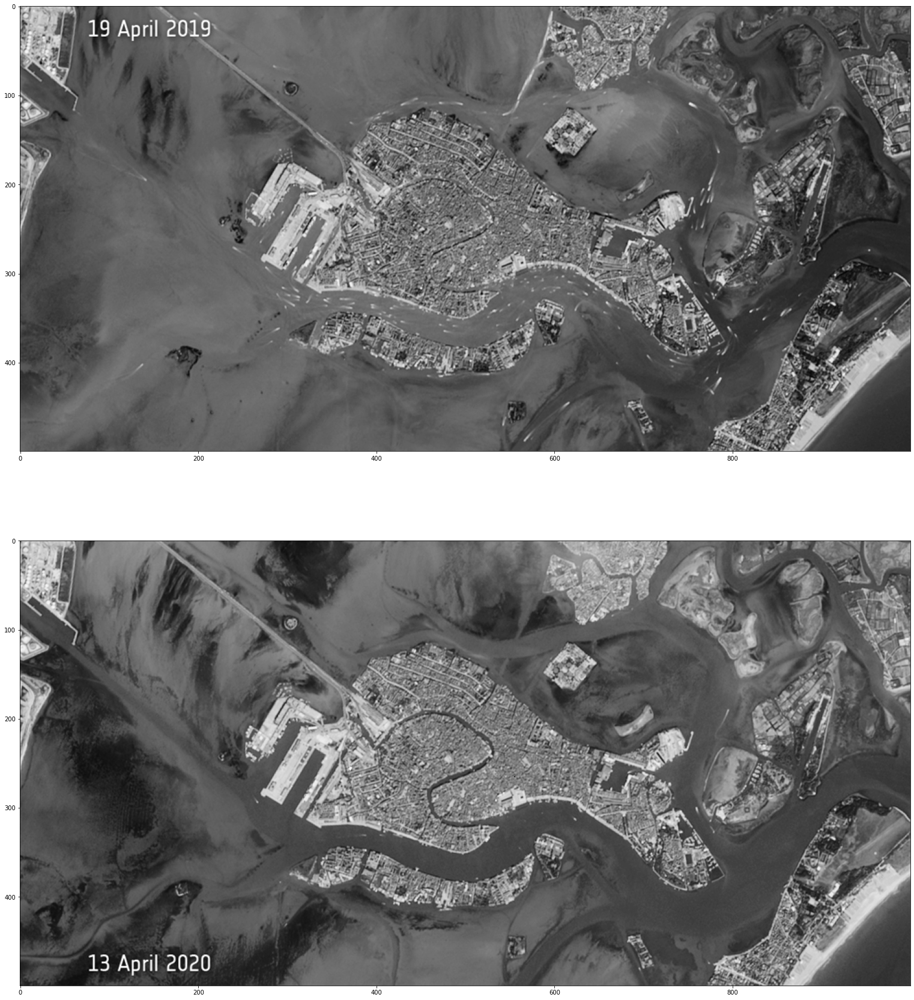

In [38]:
# Display
plt.figure(figsize=(60, 30))
plt.subplot(2, 1, 1)
plt.imshow(processed_im1, cmap="gray")
plt.subplot(2, 1, 2)
plt.imshow(processed_im2, cmap="gray")

### Différence entre `im1` et `im2`

Essayons différentes méthodes.

In [42]:
# Différence entre les deux niveaux de gris
diff = np.absolute(processed_im2 - processed_im1)

# Distance euclidienne (dans R^3) pixel à pixel
dist_rgb = np.apply_along_axis(
    np.linalg.norm,
    axis=2,
    arr=im2-im1
)

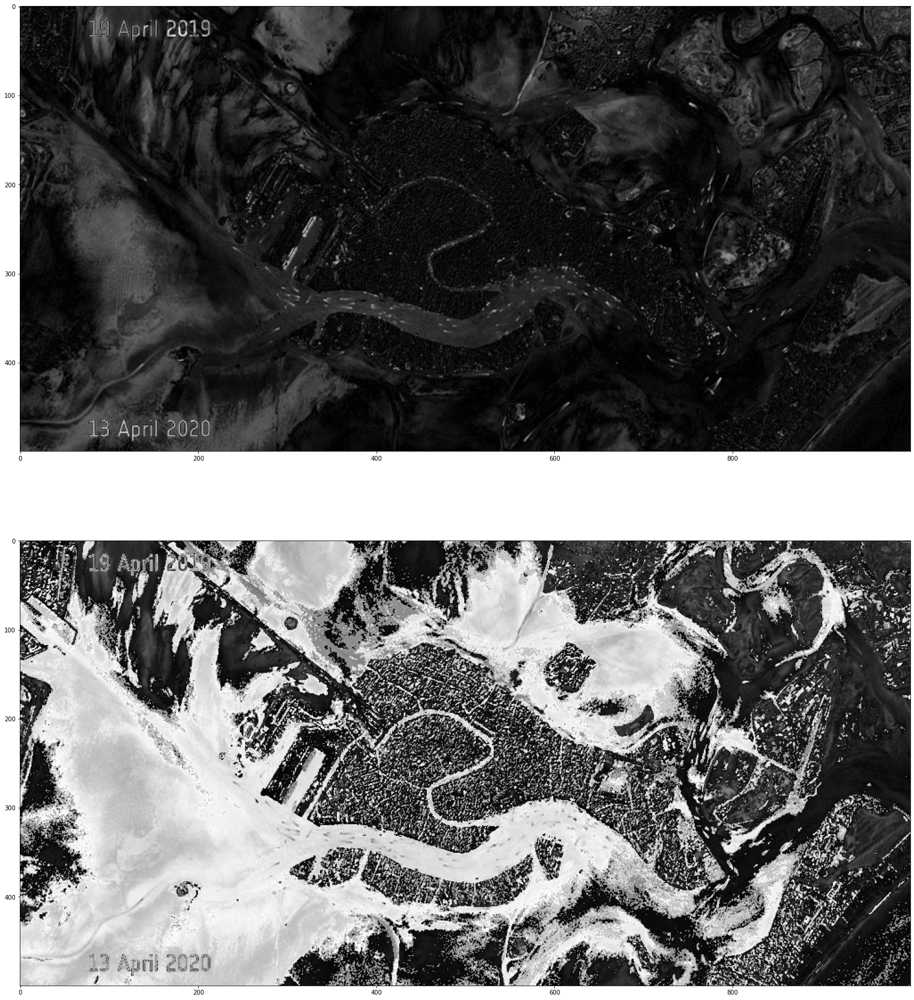

In [43]:
# Display
plt.figure(figsize=(60, 30))
plt.subplot(2, 1, 1)
plt.imshow(dist_gray, cmap="gray")
plt.subplot(2, 1, 2)
plt.imshow(dist_rgb, cmap="gray")